In [ ]:
!pip install -q -r '/content/requirements.txt'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 13.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.1/542.1 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 21.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 58.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 64.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 21.3 MB

In [ ]:
import numpy as np
import pandas as pd
import streamlit as st
import torch
from PIL import Image
from io import BytesIO
import requests
from sklearn.decomposition import PCA
import umap
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans,DBSCAN # Kmeans for Centroidal Cluserting while DBSCAN for density based
from transformers import CLIPProcessor,CLIPModel
from PIL import UnidentifiedImageError
import plotly.express as px
from tqdm import tqdm
import matplotlib.pyplot as plt
#import supervision as sv
import random

device="cuda" if torch.cuda.is_available() else "cpu"

model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor=CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

from datasets import load_dataset

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

In [ ]:
train_dataset=load_dataset("recastai/coyo-75k-augmented-captions")['train']
test_dataset=load_dataset("recastai/coyo-75k-augmented-captions")['test']

Generating train split:   0%|          | 0/73480 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/935 [00:00<?, ? examples/s]

In [ ]:
train_dataset

Dataset({
    features: ['url', 'key', 'image_phash', 'original_caption', 'tag', 'attribute', 'short_caption', 'detailed_caption', 'llm_caption'],
    num_rows: 73480
})

## Test dataset has ~970 rows, we will be using that for embeddings

In [ ]:
def plot_images_grid(images,text,grid_size=(5, 5), titles=None, size=(5, 5), cmap=None):
    from math import ceil

    nrows, ncols = grid_size
    fig, axes = plt.subplots(nrows, ncols, figsize=size)

    if nrows == 1 and ncols == 1:
        axes = [axes]  # Make axes iterable if it's a single Axes object
    else:
        axes = axes.flatten()

    for idx, (img,txt) in enumerate(zip(images,text)):
        if isinstance(img, Image.Image):
            img = img.convert("RGB")
        if cmap:
            axes[idx].imshow(img, cmap=cmap)
        else:
            axes[idx].imshow(img)

        axes[idx].set_title(txt, fontsize=10)

        axes[idx].axis('off')


    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

from tqdm import tqdm

dataframe=pd.DataFrame()
def get_image_embeddings(data):
    error_count = 0
    error_urls = []
    image_embeddings = []
    coutn=0
    data_text=data['llm_caption']
    data_url=data['url']

    dataframe=pd.DataFrame({'url':data_url,'text':data_text})
    for _,row in tqdm(dataframe.iterrows(),total=1000,desc="Processing Image"):
            image_url = row['url']
            text=row['text'][0]
            try:
                coutn+=1

                if coutn ==1000:
                    break

                response = requests.get(image_url)
                response.raise_for_status()  # Raise an exception for non-2xx status codes

                # Check if the content type is an image
                image=Image.open(BytesIO(response.content))
                if coutn<5:
                    plot_images_grid([image],[text], grid_size=(1, 1))


                inputs=processor(images=image,return_tensors="pt").to(device)
                with torch.no_grad():
                    image_embedding=model.get_image_features(**inputs)
                image_embeddings.append(image_embedding.squeeze().cpu().numpy())

            except (requests.exceptions.RequestException, UnidentifiedImageError, ValueError) as e:
                error_urls.append(image_url)
                error_count += 1

    return image_embeddings,dataframe


Processing Image:   0%|          | 0/1000 [00:00<?, ?it/s]

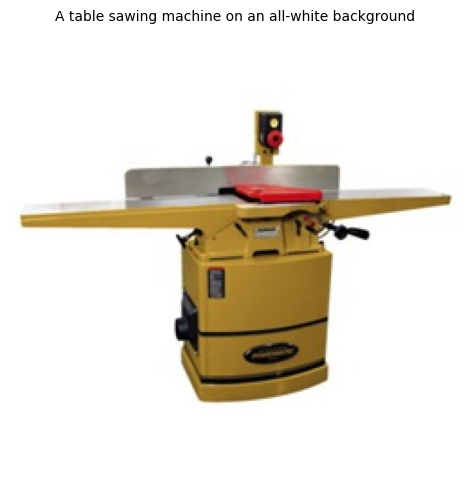

Processing Image:   0%|          | 1/1000 [00:01<24:59,  1.50s/it]

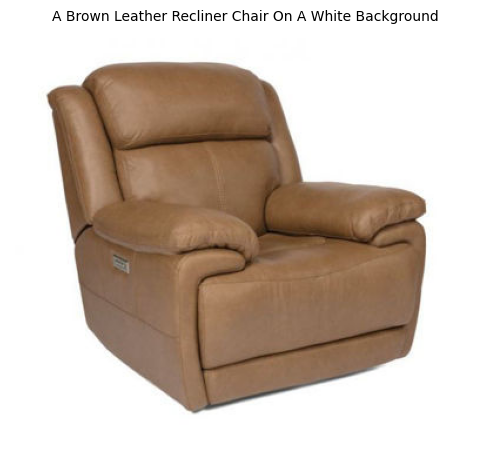

Processing Image:   0%|          | 2/1000 [00:02<24:45,  1.49s/it]

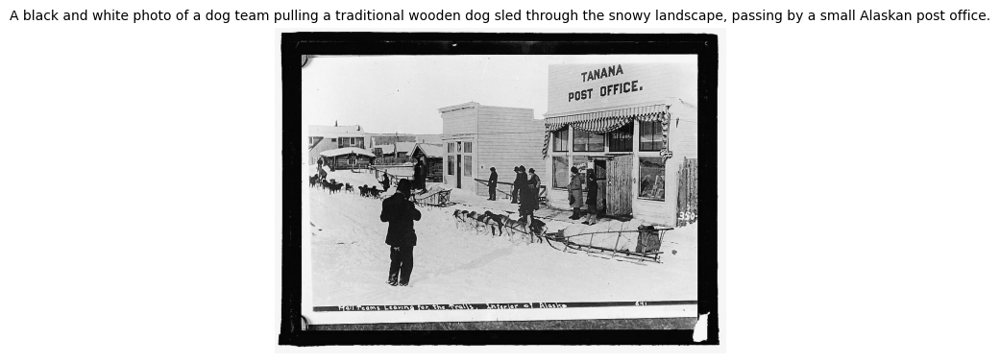

Processing Image:  14%|█▎        | 137/1000 [01:46<08:33,  1.68it/s]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
Processing Image: 100%|█████████▉| 999/1000 [25:29<00:01,  1.53s/it]


In [ ]:
image_embeddings,dataframe=get_image_embeddings(train_dataset)

#Saving the dataframe

In [ ]:
dataframe.to_csv("url_text.csv",index=False)

In [ ]:
def apply_pca(image_embeddings,n_components=3):
    pca=PCA(n_components=n_components)
    return pca.fit_transform(image_embeddings)

def apply_umap(image_embeddings,n_components=3):
    import umap
    umap=umap.UMAP(n_components=n_components)
    return umap.fit_transform(image_embeddings)

def apply_tsne(image_embeddings,n_components=3):
    tsne=TSNE(n_components=n_components)
    return tsne.fit_transform(image_embeddings)


def cluster_embeddings(embeddings, method='KMeans', n_clusters=5):
    if method == 'KMeans':
        kmeans = KMeans(n_clusters=n_clusters)
        labels = kmeans.fit_predict(embeddings)
    elif method == 'DBSCAN':
        dbscan = DBSCAN(eps=0.5, min_samples=5)
        labels = dbscan.fit_predict(embeddings)
    return labels

# Dimension Reduction of Embeddings

In [ ]:
dim_reduction="T-SNE"
clustering_algo="KMeans"
n_cluster=5

if dim_reduction == "PCA":
        reduced_embeddings = apply_pca(image_embeddings)
elif dim_reduction == "UMAP":
        reduced_embeddings = apply_umap(image_embeddings)
elif dim_reduction == "T-SNE":
        image_embeddings=np.array(image_embeddings) #converting to numpy array for T-SNE
        reduced_embeddings = apply_tsne(image_embeddings)


In [ ]:
reduced_embeddings.shape

(877, 3)

In [ ]:
import numpy as np
np.save("t-sne_embeddings.npy",reduced_embeddings)

In [ ]:
np.save("image_embeddings_train1k",image_embeddings)

In [ ]:
reduced_embeddings.shape

(878, 3)

In [ ]:
text=[]
for i in range(len(dataframe)):
   text_extracted=dataframe['text'].iloc[i][0]
   text.append(text_extracted)
text

['A table sawing machine on an all-white background',
 'A Brown Leather Recliner Chair On A White Background',
 'A blue hiking shoe with black laces provides sturdy ankle assistance and water protection ideal for backpackers who want to traverse rugged terrain while maintaining their comfort and safety',
 'A black and white photo of a dog team pulling a traditional wooden dog sled through the snowy landscape, passing by a small Alaskan post office.',
 "A pair of handmade key chains with a police officer emblem adorned on them dangles from someone's hands.",
 'This is a computer rendered image of a house.',
 'A stunning panoramic view of the Grand Canyon from the top of a rugged cliff, highlighting its towering red rock formations and vast expanse below',
 'A towering missile stands in contrast to the sleek space shuttle, both made byLockheed Martin.',
 'A sandwich with fillings visible through a toasty brown crust.',
 'The cover of Jude the Obscure by Thomas Hardy depicts a serene land

In [ ]:
len(text)

73480

# Tensorboard visualisation

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [48]:
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import tensorflow as tf
from tensorboard.plugins import projector

log_dir='logs/embedding/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

embedding_tensor=tf.convert_to_tensor(image_embeddings)
urls=dataframe['url']
text=[]
for i in range(len(dataframe)):
   text_extracted=dataframe['text'].iloc[i][0]
   text.append(text_extracted)

#KNN with 2 clusters
scaler = MinMaxScaler()
normalized_emb =  tf.convert_to_tensor(scaler.fit_transform(embedding_tensor))


kmeans = KMeans(n_clusters=15, random_state=0).fit(normalized_emb)


#writing tsv for image
with open(os.path.join(log_dir, 'img_metadata.tsv'), "w") as f:
  f.write("Corresponding LLM_Text\tCluster\n")
  for _,text,label in zip(urls,text,kmeans.labels_):
    f.write("{}\t{}\n".format(text, label))

weights = tf.Variable(embedding_tensor)
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

config = projector.ProjectorConfig()
embedding = config.embeddings.add()
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'img_metadata.tsv'
projector.visualize_embeddings(log_dir, config)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [49]:
%tensorboard --logdir /content/logs/embedding

Reusing TensorBoard on port 6006 (pid 8222), started 0:50:33 ago. (Use '!kill 8222' to kill it.)

<IPython.core.display.Javascript object>

#To run the tensoboard use "%tensorboard --logdir /path/to/logs/embedding" where log folder should be embedding logs generated using tensorflow variables